# Group 33 - Xinghao Huang - 81848509

---

# Section 1: Data Description


## 1. Descriptive Summary
- There are 5280 observations in total (2653 observations in ***athens_weekdays.csv*** dataset, 2627 observations in ***athens_weekends.csv***), and 19 variables (both datasets have the same variables, here variable *Id* is not counted since it is just an identifier rather than a meaningful variable).


- Variable Summary:

| Variable | Type | Description |
|-----------|-----------|-----------|
| realSum | Quantitative data | the total prices of the listing |
| room_type | Categorical/nominal data | different room types, including *private*, *shared*, *entire home*, *apt*. |
| room_shared | Categorical/binary data| whether a room is shared |
| room_private | Categorical/binary data | whether a room is private |
| person_capacity | Quantitative data | number of people a room can accommodate |
| host_is_superhost | Categorical/binary data | whether a host is a superhost |
| multi | Categorical/binary data | whether the listing is for multiple rooms |
| biz| Categorical/binary data | whether an observation is associated with a business |
| cleanliness_rating | Quantitative data | rating of cleanliness |
| guest_satisfaction_overall | Quantitative data | overall rating from guests comparing all listings offered by the host |
| bedrooms | Quantitative data | number of bedrooms |
| dist | Quantitative data | distance from city center |
| metro_dist | Quantitative data | distance from the nearest metro station |
| attr_index | Quantitative data | attr index |
| attr_index_norm | Quantitative data | normalized attr index |
| rest_index | Quantitative data | rest index |
| rest_index_norm | Quantitative data | normalized rest index |
| lng | Quantitative data | longitude coordiates for location identification |
| lat | Quantitative data | latitude coordiates for location identification |


## 2. Source and Information
- The datasets were originally obtained from Gyódi and Nawaro (2021), Determinants of Airbnb Prices in European Cities: A Spatial Econometrics Approach (supplementary material), published on Zenodo.
- The data were collected from Airbnb listings across multiple European cities, focusing on listing attributes, host information, and spatial factors affecting pricing.
- This dataset offers a detailed overview of Airbnb prices in Athens, including information on room type, cleanliness and satisfaction ratings, number of bedrooms, distance from the city centre, and other attributes that help explain price differences between weekday and weekend stays.

- **Citation:** Gyódi, K., & Nawaro, Ł. (2021, March 25). Determinants of Airbnb prices in European cities: A Spatial Econometrics Approach (supplementary material). Zenodo. https://zenodo.org/records/4446043#.Y9Y9ENJBwUE 

## 3. Preselection of Variables
- ***room_shared***, ***room_private***, and ***multi*** have redundant information because we can also acquire the same and even more complete information from ***room_type*** and ***bedrooms***.
- ***lng*** and ***lat*** will be dropped because they only provide raw spatial coordinates, and information regarding distance can be acquired from ***dist*** and ***metro_dist***
- ***attr_index***, ***attr_index_norm***, ***rest_index***, and ***rest_index_norm*** will also be dropped because their definitions and interpretations are unclear from the dataset documentation, and they seem like post-analysis results.

---
# Section 2: Scientific Question

## 1. State the Question
- **Question:** How is the Airbnb price in Athens associated with day type, room type, customer satisfaction, cleanliness rating, and location?
- Specifically, I want to understand which of these factors has the strongest relationship with the Airbnb price.

## 2. Name the Response
- The response variable is *realSum* (the Airbnb price in Athens).

## 3. Question Focus
- My question mainly focuses on inference since it is about understanding the effects of room type, cleanliness rating, and location on customer satisfaction rather than predicting new outcomes

---
# Section 3: Exploratory Data Analysis and Visualization

## 1. Reproducible Code

In [1]:
# load some libraries
library(ggplot2)
library(dplyr)
library(patchwork)

# I initially used install.packages(...), but it was not work


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




<br>The two datasets have been uploaded from my local devices to the STAT 301 Workspace. The below provides how they can be loaded into R

In [2]:
# reading the file
athens_weekdays <- read.csv("/home/jovyan/work/stat-301/materials/Project/data/athens_weekdays.csv", header = TRUE)
athens_weekends <- read.csv("/home/jovyan/work/stat-301/materials/Project/data/athens_weekends.csv", header = TRUE)

# check if there are any missing values
sum(is.na(athens_weekends)) == 0 

[1] TRUE

<br>Now, I will add a column indicating the type of day each observation is. It has 2 levels: ***Weekdays*** and ***Weekends***. Then, the two datasets will be merged into one dataset called ***athens***.

In [3]:
# add indicator columns to both
athens_weekdays <- athens_weekdays %>% mutate(day_type = as.factor("Weekdays"))
athens_weekends <- athens_weekends %>% mutate(day_type = as.factor("Weekends"))

# merge the two datasets into one
athens <- rbind(athens_weekdays, athens_weekends)
head(athens)

,X,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,⋯,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,day_type
,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<dbl>,⋯,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,0,129.82448,Entire home/apt,False,False,4,False,0,0,10,⋯,2,2.8139635,0.8818900,55.34857,2.086871,78.77838,5.915160,23.76600,37.98300,Weekdays
2,1,138.96375,Entire home/apt,False,False,4,True,1,0,10,⋯,1,0.4072929,0.3045679,240.30665,9.060559,407.16770,30.572629,23.73168,37.97776,Weekdays
3,2,156.30492,Entire home/apt,False,False,3,True,0,1,10,⋯,1,1.2372111,0.2884881,199.50737,7.522257,395.96740,29.731642,23.72200,37.97900,Weekdays
4,3,91.62702,Entire home/apt,False,False,4,True,1,0,10,⋯,1,4.3674572,0.2974673,39.80305,1.500740,58.70658,4.408047,23.72712,38.01435,Weekdays
5,4,74.05151,Private room,False,True,2,False,0,0,10,⋯,1,2.1941850,0.3852657,78.73340,2.968577,113.32597,8.509204,23.73391,37.99529,Weekdays
6,5,113.88934,Entire home/apt,False,False,6,True,1,0,10,⋯,2,2.0712056,0.4538674,96.58899,3.641806,158.64432,11.911981,23.71584,37.98598,Weekdays


In [4]:
summary(athens$realSum)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
   42.88    98.66   127.72   151.74   171.54 18545.45 

<br>Note that there are potentially extreme outliers in *realSum*. They will make it harder to see the pattern of the majority of individual observations. Therefore, I will filter them out to have a better view for the visualization. 
<br><br>The values within the whiskers, [Q1 - 1.5IQR, Q3 + 1.5IQR], are included, which are the non-outlier observations among the original values of *realSum*.

In [5]:
# filter the data
realSum_within_range <- athens %>%
    group_by(room_type, day_type) %>%
    filter( (realSum >= quantile(realSum,0.25)-1.5*IQR(realSum)) & (realSum <= quantile(realSum,0.75)+1.5*IQR(realSum)) ) %>%
    ungroup() %>%
    select(realSum, day_type, room_type, dist) # these 4 variables will be used for the visualization(s)

head(realSum_within_range)

realSum,day_type,room_type,dist
<dbl>,<fct>,<chr>,<dbl>
129.82448,Weekdays,Entire home/apt,2.8139635
138.96375,Weekdays,Entire home/apt,0.4072929
156.30492,Weekdays,Entire home/apt,1.2372111
91.62702,Weekdays,Entire home/apt,4.3674572
74.05151,Weekdays,Private room,2.1941850
113.88934,Weekdays,Entire home/apt,2.0712056


## 2. Visualization

The cell below will use both filtered and unfiltered datasets to generate boxplots that are faceted by *room_type*. *day_type* is encoded in the x-channel, *realSum*  is encoded in the y-channel, and *day_type* is encoded in the fill-channel, with individual observations added.

In [6]:
# boxplot with original realSum values
box_price_by_room_original <- athens %>%
    ggplot(aes(x = day_type, y = realSum, fill = day_type)) +
    geom_boxplot(fatten = 4) + # adjust the width of the median bar
    geom_jitter(color="gray", size=0.4, alpha=0.6) + # adding individual observations
    facet_grid(~room_type) + # facet by room_type
    ggtitle("Unfiltered Airbnb Prices Distribution per Room/Day Type") +
    labs(x = "Day Types", y = "Unfiltered Airbnb Price in Athens", fill = "Day Type")


# boxplot with filtered realSum values
box_price_by_room_filtered <- realSum_within_range %>%
    ggplot(aes(x = day_type, y = realSum, fill = day_type)) +
    geom_boxplot(fatten = 4) + # adjust the width of the median bar
    geom_jitter(color="gray", size=0.4, alpha=0.6) + # adding individual observations
    facet_grid(~room_type) + # facet by room_type
    ggtitle("Filtered Airbnb Prices Distribution per Room/Day Type") +
    labs(x = "Day Types", y = "Filtered Airbnb Price in Athens", fill = "Day Type")

<br>

The cell below will use both filtered and unfiltered datasets to generate scatterplots that are faceted by room_type. dist is encoded in the x-channel, realSum is encoded in the y-channel, and room_type is encoded in the color-channel

In [7]:
scatter_price_vs_dist_original <- athens %>%
    ggplot(aes(x = dist, y = realSum, color = room_type))+
    geom_point() + 
    facet_grid(~room_type) + 
    ggtitle("Unfiltered Airbnb Price of Each Room Type Versus Distance from City Center ") +
    labs(x = "Distance from City Center", y = "Unfiltered Airbnb Price in Athens", color = "Room Type")


scatter_price_vs_dist_filtered <- realSum_within_range %>%
    ggplot(aes(x = dist, y = realSum, color = room_type))+
    geom_point() + 
    facet_grid(~room_type) + 
    ggtitle("Filtered Airbnb Price of Each Room Type Versus Distance from City Center ") +
    labs(x = "Distance from City Center", y = "Filtered Airbnb Price in Athens", color = "Room Type")

<br>The below cell will concatenate theses plots into one

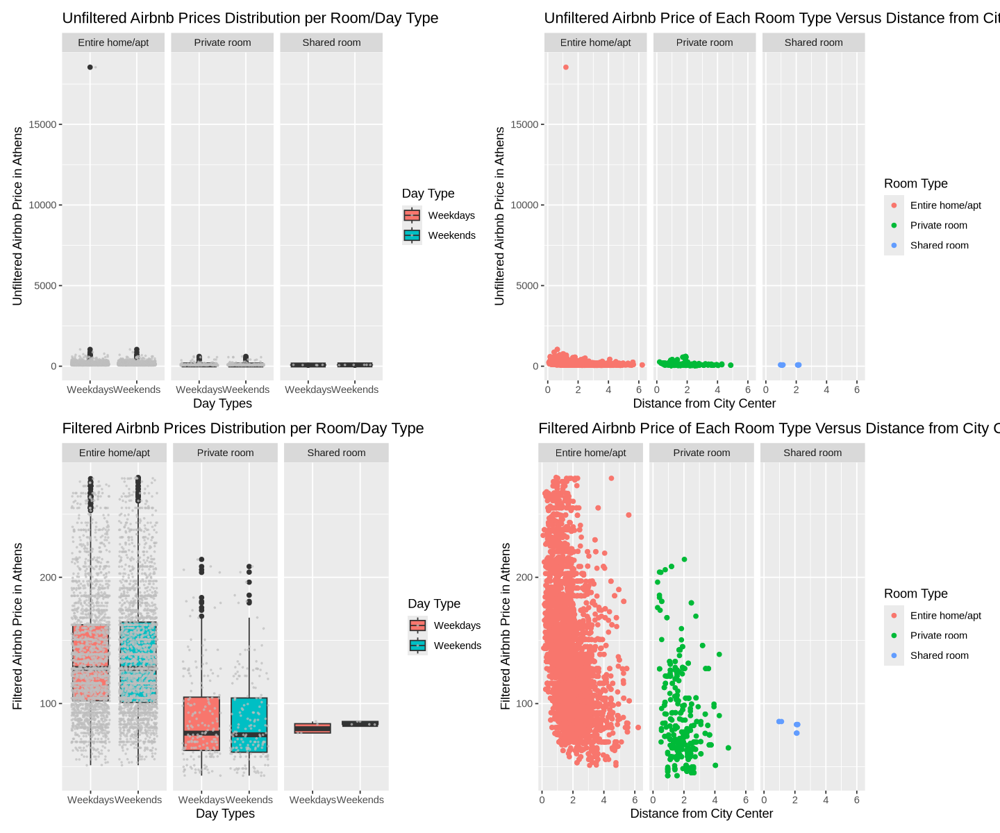

In [8]:
# resize the plot for a better view
options(repr.plot.width = 12, repr.plot.height = 10)

# concatenate these plots into one
(box_price_by_room_original + scatter_price_vs_dist_original )/(box_price_by_room_filtered+ scatter_price_vs_dist_filtered)

## 3. Interpretations

#### Explain why you consider this plot relevant to address your question or to explore the data.
- The boxplot(s) show the price distribution by room and day type, while the scatterplot(s) explore how location is associated with price for each room category.
- Removing extreme outliers is important because they distort the scale and hide overall pricing patterns.
- With filtered data, the plots clearly reveal typical price ranges and meaningful relationships between key factors influencing Airbnb prices.<br>

#### Interpret briefly the results obtained.
- For the plots with filtered Airbnb price, the Entire home/apt category has the most listings and the highest prices overall, with a wider spread compared to Private room and Shared room, suggesting greater price variation in full apartments.
- There is no strong distinction between weekday and weekend prices within each room type, indicating that daily demand fluctuations may not heavily affect Airbnb pricing in Athens.
- Most Airbnb listings are close to the city center, where a wide range of prices exists, implying that location alone may not fully explain price differences among listings.<br>

#### What do you learn from your visualization?
- Isolating the effect of room type will be essential in later inference stages, as each room type shows a distinct price distribution. Without doing so, I may encounter issues such as Simpson’s Paradox, which could lead to misleading conclusions when combining groups.
- Because these visualizations exclude extreme outliers in realSum for clarity, the future analyses should consider their impact, which may largely change the results or increase variability, affecting the reliability of model estimates.